<a href="https://colab.research.google.com/github/XKineticX/DL_SOC/blob/main/1_G_09_McMst_GRU.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 0. Version Control

In [ ]:
'''
####### Version control:
a.1.1 : ch 1: Base + Subsampling
a.1.2 : ch 2: Global SOC
a.1.3 : ch 3: normalisation global
a.1.4 : ch 4: Array Transformation (3D)
a.1.5 : ch 5: Subsampling (1Hz) +  records  delta
a.1.6 : Tensorboard
a.1.7 : Separate tetsing set per temperature
a.1.8 : Positive temprature only
a.1.9 : Validation from files
'''


' \n####### Version control:\na.1.1 : ch 1: Base + Subsampling \na.1.2 : ch 2: Global SOC\na.1.3 : ch 3: normalisation global\na.1.4 : ch 4: Array Transformation (3D)\na.1.5 : ch 5: Subsampling (1Hz) +  records  delta\na.1.6 : Tensorboard\na.1.7 : Separate tetsing set per temperature \na.1.8 : Positive temprature only\na.1.9 : Validation from files \n'

# 1. Pre-Processing

## 1.1 Load Libraries

In [ ]:
!pip install -U tensorboard_plugin_profile                                                      # Requirement already satisfied
#!pip install tensorboard                                                                        # not needed wih colab
!pip install model_profiler

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 45.8 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from numpy.random import seed
seed(1)

In [ ]:
import numpy as np
import pandas as pd
#import logging
#from sklearn.preprocessing import MinMaxScaler
#from datetime import datetime, timedelta
#import math ,os ,ntpath ,sys ,, chardet, glob, time, gc
import os, time, datetime, psutil, threading
import plotly.graph_objects as go
import matplotlib.pyplot as plt
%matplotlib inline


In [ ]:
## Tuning Parameters
#os.environ['TF_GPU_THREAD_MODE']='gpu_private'
#%env TF_GPU_THREAD_MODE

In [ ]:
import tensorflow as tf
tf.random.set_seed(2)
from tensorflow import keras
from tensorflow.keras import layers
from keras.models import Sequential
from keras.layers.core import Dense,  Activation , Dropout
from keras.optimizers import Adam ,RMSprop                                                      #SGD,
from keras.layers import LSTM,GRU                                                               #, Embedding, RepeatVector, TimeDistributed, Masking
from keras.callbacks import EarlyStopping, ModelCheckpoint,  History, CSVLogger
from tensorflow.keras.callbacks import TensorBoard
from model_profiler import model_profiler
#from keras.utils import np_utils
#import scipy.io
#from importlib import reload

## 1.2. Parameters configuration

In [ ]:

### Data Parameters
data_path='/content/drive/MyDrive/Datasets/LG/'
folders=['0deg', '10deg', '25deg', '40deg', 'n10deg', 'n20deg']

### Files
HPPC_files = ['0deg/585_HPPC', '10deg/575_HPPC', '25deg/549_HPPC', '40deg/555_HPPC']            ## Positive Temp: 'n10deg/593_HPPC', 'n20deg/607_HPPC']

### all temp

# all files for training
#train_files = [ '40deg/556_HWFET',  '40deg/556_LA92',  '40deg/556_UDDS',  '40deg/556_US06',  '40deg/556_Mixed2',  '40deg/557_Mixed3', '25deg/551_HWFET',  '25deg/551_LA92',  '25deg/551_UDDS',  '25deg/551_US06',  '25deg/551_Mixed2',  '25deg/552_Mixed8','10deg/576_HWFET',  '10deg/582_LA92',  '10deg/576_UDDS',  '10deg/567_US06',  '10deg/567_Mixed2',  '10deg/571_Mixed8', '0deg/589_HWFET',   '0deg/589_LA92',   '0deg/589_UDDS',   '0deg/589_US06',   '0deg/589_Mixed2',   '0deg/590_Mixed8' ,'n10deg/596_HWFET', 'n10deg/596_LA92', 'n10deg/596_UDDS', 'n10deg/601_US06', 'n10deg/601_Mixed2', 'n10deg/604_Mixed8','n20deg/610_HWFET', 'n20deg/610_LA92', 'n20deg/610_UDDS', 'n20deg/610_US06', 'n20deg/610_Mixed2', 'n20deg/611_Mixed8']

# mixed_2 cycles removed  and added to validation set
#& Training files sorted  by (Cycle,Temperature)
#train_files = ['40deg/556_HWFET', '25deg/551_HWFET', '10deg/576_HWFET', '0deg/589_HWFET', '40deg/556_LA92', '25deg/551_LA92', '10deg/582_LA92', '0deg/589_LA92', '40deg/556_UDDS', '25deg/551_UDDS', '10deg/576_UDDS', '0deg/589_UDDS', '40deg/556_US06', '25deg/551_US06', '10deg/567_US06', '0deg/589_US06', '40deg/557_Mixed3', '25deg/552_Mixed8', '10deg/571_Mixed8', '0deg/590_Mixed8']

###################################################################################################### arangement(9)
train_files = [ '40deg/556_HWFET', '40deg/556_LA92', '40deg/556_UDDS', '40deg/556_US06', '40deg/556_Mixed2'
              ,                    '25deg/551_LA92', '25deg/551_UDDS', '25deg/551_US06', '25deg/551_Mixed2'
              , '10deg/576_HWFET', '10deg/582_LA92', '10deg/576_UDDS', '10deg/567_US06', '10deg/567_Mixed2'
              ,  '0deg/589_HWFET',  '0deg/589_LA92',  '0deg/589_UDDS',  '0deg/589_US06',  '0deg/589_Mixed2' ,'0deg/590_Mixed5']

validation_files = ['40deg/556_Mixed1', '25deg/551_Mixed1', '10deg/567_Mixed1', '0deg/589_Mixed1']

test_files_40deg  = ['40deg/557_Mixed3']
test_files_25deg  = ['25deg/552_Mixed8']
test_files_10deg  = ['10deg/571_Mixed8']
test_files_0deg   = ['0deg/590_Mixed6']


In [ ]:
### Experiment Parameters
IS_COLAB = 1
experiment = "G-2-2m-11-fin_"
tb_log_dir = data_path + 'results/tb_log/' +experiment +datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

### Data Parameters
win_sz = 24                                                                                     #### window size for each features record (2nd Dimension)
sample_delta = 1                                                                                #### delte between subsequent sample records  (n records / win_sz)

#### Model Training  Parameters
patience_val=5                                                                                  #### Early stopping Patience value
min_delta_val=0.0002                                                                            #### Minimum value counted as loss improvement
epochs_num=200                                                                                  #### Training epoch number
batch_size_val=144                                                                              #### Batch size
#validation_split_val=0.2                                                                       #### Validation set split
learning_rate_val=0.00002

In [ ]:
### Deterministic model
tf.keras.utils.set_random_seed(1)
tf.config.experimental.enable_op_determinism()


## 1.3 Data mount / verify



In [ ]:
!ls /content/drive/MyDrive/Datasets/LG


0deg  10deg  25deg  40deg  n10deg  n20deg  results  Summ  temp	trained_model


## 1.4  functions definitions

In [ ]:
def  max_cycle_Capacity(files):
  max_cycles_Capacity=[]
  for file in files:
    cycle=pd.read_csv(data_path + file + '.csv', skiprows=30)
    cycle.columns = ['Time Stamp','Step','Status','Prog Time','Step Time','Cycle','Cycle Level','Procedure','Voltage','Current','Temperature','Capacity','WhAccu','Cnt','Empty']
    #max_Capacity = max(cycle['Capacity'])
    max_cycles_Capacity.append(max(abs(cycle['Capacity'])))
  return max_cycles_Capacity

### Debug
#max_discharge = max(max_cycle_Capacity(HPPC_files))
#max_discharge


In [ ]:
def load_csv(files, subsample=0, output_capacity=False, output_time=False):
  """
  1. Load CSV
  2. Specify Columns
  3. add SOC Capacity column
  4. X,Y Arrays
  5. return single numpy array; (V,I,T,SOC)
  """
  cycles_lst = []
  for file in files:
      cycle = pd.read_csv(data_path + file + '.csv', skiprows=30,parse_dates=[0])
      cycle.columns = ['Time Stamp','Step','Status','Prog Time','Step Time','Cycle','Cycle Level','Procedure','Voltage','Current','Temperature','Capacity','WhAccu','Cnt','Empty']
      #cycle = cycle.query("Status == 'TABLE' ")                                                 ######### Removing PAU, Keeping: TABLE samples only @ L-2-2d-20
      cycle = cycle[["Time Stamp","Voltage", "Current", "Temperature", "Capacity"]]
      cycle = cycle.set_index("Time Stamp")

      if subsample == 1:                                                                          ##### (ch 4) : SubSample to 1 Hz
          cycle = cycle.resample('S').mean()
      x = cycle[["Voltage", "Current", "Temperature"]].to_numpy()

      max_discharge = max(max_cycle_Capacity(HPPC_files))                                         ##### (ch 1) : global maximum of SOC
      cycle["SoC Capacity"] = max_discharge + cycle["Capacity"]
      cycle["SoC Percentage"] = cycle["SoC Capacity"] / max_discharge                             ####/max(cycle["SoC Capacity"])  - Ch 1
      y = cycle[["SoC Percentage"]].to_numpy()


      if np.isnan(np.min(x)) or np.isnan(np.min(y)):
      #                self.logger.info("There is a NaN in cycle " + file + ", removing row")	    ####  logger removed
          x = x[~np.isnan(x).any(axis=1)]
          y = y[~np.isnan(y).any(axis=1)].reshape(-1, y.shape[1])
      cycles_lst.append(np.column_stack((x,y)))
  cycles = [j for i in cycles_lst for j in i]
  cycles_ar=np.array(cycles)
  return 	cycles_ar

In [ ]:
###### Debug: load_csv ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
#cycles=load_csv(test_files)
#cycles.shape
#cycles[:30,3].reshape(30,1)
#train1=load_csv(train_files,subsample=1)
#train1.shape

In [ ]:
def  features_range(folders):
	'''
	parse each cycle in each folder and extract features minimum and maximum  (V,I,T)
	'''
	feat_min=[]
	feat_max=[]
	for folder in folders:
		files_raw=list(os.popen('ls '+data_path+folder))
		files=[i.split(".")[0] for i in files_raw]
		for file in files:
			cycle=pd.read_csv(data_path + folder +"/"+ file + '.csv', skiprows=30)
			cycle.columns = ['Time Stamp','Step','Status','Prog Time','Step Time','Cycle','Cycle Level','Procedure','Voltage','Current','Temperature','Capacity','WhAccu','Cnt','Empty']
			feat_max.append([folder, file, max(abs(cycle['Voltage'])),max(abs(cycle['Current'])),max(abs(cycle['Temperature']))])
			feat_min.append([folder, file, min((cycle['Voltage'])),min((cycle['Current'])),min((cycle['Temperature']))])
	return feat_min,feat_max


In [ ]:
###### Debug:  features_range ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
#feat_range=np.array(features_range(folders))
# min_voltage,max_voltage = min(feat_range[0,:,2].astype(float)),max(feat_range[1,:,2].astype(float))
# min_current,max_current = min(feat_range[0,:,3].astype(float)),max(feat_range[1,:,3].astype(float))
# min_temperature,max_temperature = min(feat_range[0,:,4].astype(float)),max(feat_range[1,:,4].astype(float))
# min_voltage,max_voltage , min_current,max_current, min_temperature,max_temperature
#('2.78628', '4.2399', '-11.99656', '9.74896', '-0.63095', '9.99006')


In [ ]:
def features_norm(cycles):
	'''
	1. calls feat_range to parse all files in all directories for min,max range ## ela: 20 sec
	2. creates empty array with 3 columns for features, same length as cycles, without SOC
	3. updates the array with normalised values within range(0,1)
	'''
	feat_norm=np.zeros(shape=(cycles.shape[0],3),dtype=float)
	feat_range=np.array(features_range(folders))
	min_voltage,max_voltage = min(feat_range[0,:,2].astype(float)),max(feat_range[1,:,2].astype(float))
	min_current,max_current = min(feat_range[0,:,3].astype(float)),max(feat_range[1,:,3].astype(float))
	min_temperature,max_temperature = min(feat_range[0,:,4].astype(float)),max(feat_range[1,:,4].astype(float))
	feat_norm[:,0] = (cycles[:,0]-min_voltage)/(max_voltage-min_voltage)
	feat_norm[:,1] = (cycles[:,1]-min_current)/(max_current-min_current)
	feat_norm[:,2] = (cycles[:,2]-min_temperature)/(max_temperature-min_temperature)
	return feat_norm

In [ ]:
def array_transformation(feat_2D, win_sz=win_sz,rec_adv=win_sz):
	'''
	1D: Sample, 2D: window size, 3D: variables
  rec_adv controls hows the following row advance in time
  '''
	feat_3d= []
	#if var_no <> 1:
	for j in range(0,feat_2D.shape[0] - win_sz, rec_adv):
		feat_3d.append(feat_2D[j:j+win_sz])
	return  np.array(feat_3d)

In [ ]:
###### Run : array_transformation
#SOC=cycles[:,3].reshape(-1,1)
#SOC_3D=array_transformation(SOC)
#feat_norm_3D=array_transformation(feat_norm)
#feat_norm_3D.shape, SOC_3D.shape
#SOC_Y = SOC_3D[:,-1,0].reshape(-1,1,1)
#SOC_Y.shape

#2. Data Processing

## 2.1 load csv  to array variables

In [ ]:
### Loading 	(returned structure : numpy array)
## returns array of 4 columns (V,I,T,SOC)
train,validation,test_40deg ,test_25deg ,test_10deg ,test_0deg  ,test_n10deg,test_n20deg=None,None,None,None,None,None,None,None
validation=load_csv(validation_files,subsample=1)
train=load_csv(train_files,subsample=1)
test_40deg  = load_csv(test_files_40deg	 ,subsample=1)
test_25deg  = load_csv(test_files_25deg	 ,subsample=1)
test_10deg  = load_csv(test_files_10deg	 ,subsample=1)
test_0deg   = load_csv(test_files_0deg	 ,subsample=1)
#test_n10deg = load_csv(test_files_n10deg ,subsample=1)
#test_n20deg = load_csv(test_files_n20deg ,subsample=1)

##2.2 Data Processing
- Normalisation
- Variable splitting
- Arrays vectorization


In [ ]:
### Variables split & Nomralisation  (returned structure : numpy array)
## featuers: returns normalised features as 2D array of 3 columns (V,I,T)
train_norm= features_norm(train)
validation_norm= features_norm(validation)

test_40deg_norm =features_norm(test_40deg)
test_25deg_norm =features_norm(test_25deg)
test_10deg_norm =features_norm(test_10deg)
test_0deg_norm =features_norm(test_0deg)
#test_n10deg_norm =features_norm(test_n10deg)
#test_n20deg_norm =features_norm(test_n20deg)

SOC_train=train[:,3].reshape(-1,1)
SOC_validation=validation[:,3].reshape(-1,1)


SOC_test_40deg=test_40deg[:,3].reshape(-1,1)
SOC_test_25deg=test_25deg[:,3].reshape(-1,1)
SOC_test_10deg=test_10deg[:,3].reshape(-1,1)
SOC_test_0deg=test_0deg[:,3].reshape(-1,1)
#SOC_test_n10deg=test_n10deg[:,3].reshape(-1,1)
#SOC_test_n20deg=test_n20deg[:,3].reshape(-1,1)


In [ ]:
### Transformation (returned structure : numpy array)
##  featuers: 3D vectorisation  (samples,window,features)
##  SOC: 3D vectorisation  		(samples,window,1)
##  SOC: last value of the configured window

train_norm_3D=array_transformation(train_norm,rec_adv=sample_delta)
validation_norm_3D=array_transformation(validation_norm,rec_adv=sample_delta)
#test_norm_3D =array_transformation(test_norm,rec_adv=sample_delta)                             ## all Tempratures
test_40deg_norm_3D =array_transformation(test_40deg_norm,rec_adv=sample_delta)
test_25deg_norm_3D =array_transformation(test_25deg_norm,rec_adv=sample_delta)
test_10deg_norm_3D =array_transformation(test_10deg_norm,rec_adv=sample_delta)
test_0deg_norm_3D =array_transformation(test_0deg_norm,rec_adv=sample_delta)
#test_n10deg_norm_3D =array_transformation(test_n10deg_norm,rec_adv=sample_delta)
#test_n20deg_norm_3D =array_transformation(test_n20deg_norm,rec_adv=sample_delta)

SOC_train_3D=array_transformation(SOC_train,rec_adv=sample_delta)
SOC_validation_3D=array_transformation(SOC_validation,rec_adv=sample_delta)

# SOC_test_3D=array_transformation(SOC_test,rec_adv=sample_delta)                               ## all Tempratures
SOC_test_40deg_3D=array_transformation(SOC_test_40deg	,rec_adv=sample_delta)
SOC_test_25deg_3D=array_transformation(SOC_test_25deg	,rec_adv=sample_delta)
SOC_test_10deg_3D=array_transformation(SOC_test_10deg	,rec_adv=sample_delta)
SOC_test_0deg_3D=array_transformation(SOC_test_0deg	,rec_adv=sample_delta)
#SOC_test_n10deg_3D=array_transformation(SOC_test_n10deg	,rec_adv=sample_delta)
#SOC_test_n20deg_3D=array_transformation(SOC_test_n20deg	,rec_adv=sample_delta)

SOC_train_Y = SOC_train_3D[:,-1,0].reshape(-1,1,1)
SOC_validation_Y = SOC_validation_3D[:,-1,0].reshape(-1,1,1)
#SOC_test_Y = SOC_test_3D[:,-1,0].reshape(-1,1,1)                                               ## all Tempratures
SOC_test_40deg_Y = SOC_test_40deg_3D[:,-1,0].reshape(-1,1,1)
SOC_test_25deg_Y = SOC_test_25deg_3D[:,-1,0].reshape(-1,1,1)
SOC_test_10deg_Y = SOC_test_10deg_3D[:,-1,0].reshape(-1,1,1)
SOC_test_0deg_Y = SOC_test_0deg_3D[:,-1,0].reshape(-1,1,1)
#SOC_test_n10deg_Y = SOC_test_n10deg_3D[:,-1,0].reshape(-1,1,1)
#SOC_test_n20deg_Y = SOC_test_n20deg_3D[:,-1,0].reshape(-1,1,1)


In [ ]:
## Reaname
#train_x,test_x=train_norm_3D,test_norm_3D                                                      ## all Temperatures
train_x=train_norm_3D
validation_x=validation_norm_3D
test_40deg_x=test_40deg_norm_3D
test_25deg_x=test_25deg_norm_3D
test_10deg_x=test_10deg_norm_3D
test_0deg_x=test_0deg_norm_3D
#test_n10deg_x=test_n10deg_norm_3D
#test_n20deg_x=test_n20deg_norm_3D

#train_y,test_y=SOC_train_Y,SOC_test_Y                                                           ## all Temperatures
train_y=SOC_train_Y
validation_y=SOC_validation_Y

test_40deg_y=SOC_test_40deg_Y
test_25deg_y=SOC_test_25deg_Y
test_10deg_y=SOC_test_10deg_Y
test_0deg_y=SOC_test_0deg_Y
#test_n10deg_y=SOC_test_n10deg_Y
#test_n20deg_y=SOC_test_n20deg_Y

In [ ]:
## verify size
print('train_x: ',	train_x.shape)
print('train_y: ',	train_y.shape)
print('validation_x: ',	validation_x.shape)
print('validation_y: ',	validation_y.shape)

print('test_40deg_x: ',	test_40deg_x.shape)
print('test_25deg_x: ',	test_25deg_x.shape)
print('test_10deg_x: ',	test_10deg_x.shape)
print('test_0deg_x: ',	test_0deg_x.shape)
#print('test_n10deg_x: ',	test_n10deg_x.shape)
#print('test_n20deg_x: ',	test_n20deg_x.shape)
print('test_40deg_y: ',	test_40deg_y.shape)
print('test_25deg_y: ',	test_25deg_y.shape)
print('test_10deg_y: ',	test_10deg_y.shape)
print('test_0deg_y: ',	test_0deg_y.shape)
#print('test_n10deg_y: ',	test_n10deg_y.shape)
#print('test_n20deg_y: ',	test_n20deg_y.shape)

# @sample_delta=win_sz : ((244, 256, 3), (29, 256, 3), (244, 1, 1), (29, 1, 1))
# @sample_delta=1      :((62450, 256, 3), (7279, 256, 3), (62450, 1, 1), (7279, 1, 1))
# @sample_delta=5      :((12490, 256, 3), (1456, 256, 3), (12490, 1, 1), (1456, 1, 1))

train_x:  (166386, 24, 3)
train_y:  (166386, 1, 1)
validation_x:  (24887, 24, 3)
validation_y:  (24887, 1, 1)
test_40deg_x:  (6739, 24, 3)
test_25deg_x:  (8569, 24, 3)
test_10deg_x:  (8119, 24, 3)
test_0deg_x:  (6225, 24, 3)
test_40deg_y:  (6739, 1, 1)
test_25deg_y:  (8569, 1, 1)
test_10deg_y:  (8119, 1, 1)
test_0deg_y:  (6225, 1, 1)


##2.3 Data Display

In [ ]:
################# Graphing
# display_x = train_x.reshape(train_x.shape[0]*train_x.shape[1], train_x.shape[2])
# display_y = train_y.reshape(train_y.shape[0]*train_y.shape[1], train_y.shape[2])

############################################# notebok crash after sample_delta changed to 1 or 3 instead of win_sz
# fig = go.Figure()
# fig.add_trace(go.Scatter(y=display_x[:,0],
#                     mode='lines', name='Voltage'))
# fig.add_trace(go.Scatter(y=display_x[:,1],
#                     mode='lines', name='Current'))
# fig.add_trace(go.Scatter(y=display_x[:,2],
#                     mode='lines', name='Temperature'))
# fig.update_layout(title='X Data',
#                 xaxis_title='Step',
#                 yaxis_title='X',
#                 width=1400,
#                 height=600)
# fig.show()

# fig = go.Figure()
# fig.add_trace(go.Scatter(y=display_y[:,0],
#                     mode='lines', name='SoC'))
# fig.update_layout(title='Y Data',
#                 xaxis_title='Step',
#                 yaxis_title='SoC',
#                 width=1400,
#                 height=600)


#3. Model Training

##3.1  Network definition

In [ ]:
%load_ext tensorboard

In [ ]:
experiment_name = experiment+time.strftime("%Y-%m-%d-%H-%M")
print(experiment_name)

# Model definition
opt = tf.keras.optimizers.Adam(learning_rate=learning_rate_val)

model = Sequential()
###### base start
model.add(GRU(20, activation='selu',return_sequences=True,input_shape=(train_x.shape[1], train_x.shape[2])))
model.add(GRU(16, activation='selu',return_sequences=True,input_shape=(train_x.shape[1], train_x.shape[2])))
model.add(GRU(8, activation='selu', return_sequences=False))
model.add(Dense(8, activation='selu'))
model.add(Dense(1, activation='selu'))                                                          #Base: linear # sigmoid
model.summary()

model.compile(optimizer=opt, loss='huber', metrics=['mae',tf.keras.metrics.RootMeanSquaredError(name='rmse')])                      # , tf.keras.metrics.RootMeanSquaredError(name='rmse') : redundant with mse

es  = EarlyStopping(monitor='val_mae', patience=patience_val,min_delta=min_delta_val)
mc  = ModelCheckpoint(data_path + 'results/trained_model/%s_best.h5' % experiment_name, save_best_only=True, monitor='val_loss')
csv = CSVLogger(data_path + 'results/trained_model/%s_logger.csv' % experiment_name)
tb_cb = tf.keras.callbacks.TensorBoard(log_dir=tb_log_dir, histogram_freq=1,write_graph=True, write_images=True, update_freq='epoch', embeddings_freq=1,profile_batch=(1,20))


G-2-2m-11-fin_2023-05-06-05-09
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 24, 20)            1500      
                                                                 
 gru_1 (GRU)                 (None, 24, 16)            1824      
                                                                 
 gru_2 (GRU)                 (None, 8)                 624       
                                                                 
 dense (Dense)               (None, 8)                 72        
                                                                 
 dense_1 (Dense)             (None, 1)                 9         
                                                                 
Total params: 4,029
Trainable params: 4,029
Non-trainable params: 0
_________________________________________________________________


## 3.2 model training

In [ ]:
keras.backend.clear_session()

In [ ]:
'''
Returns system wide avergae CPU utilisation each every seconds for 100 times by default
'''
def cpu_mon(int=15,count=100):
	for i in range (count):
		print('.:c:', i,':CPU%: ', psutil.cpu_percent(int))
		print('.:m:', i,':RAM(GB):', psutil.virtual_memory()[3]/1000000000)
		time.sleep(int)
cpu_thread = threading.Thread(target=cpu_mon)
cpu_thread.start()

In [ ]:
%%time
#start_tm = time.time()
model_hist = model.fit(train_x, train_y, batch_size=batch_size_val,epochs=epochs_num, validation_data=(validation_x, validation_y),shuffle=False,verbose=2, callbacks = [es, csv, tb_cb] )
#validation_split=validation_split_val,
#end_tm = time.time()
#print('Elapsed time: ',(end_tm - start_tm))


Epoch 1/200
.:c: 0 :CPU%:  76.1
.:m: 0 :RAM(GB): 1.72918784
.:c: 1 :CPU%:  95.8
.:m: 1 :RAM(GB): 1.715474432
1156/1156 - 63s - loss: 0.0785 - mae: 0.2952 - rmse: 0.3975 - val_loss: 0.0248 - val_mae: 0.1813 - val_rmse: 0.2226 - 63s/epoch - 55ms/step
Epoch 2/200
.:c: 2 :CPU%:  70.8
.:m: 2 :RAM(GB): 1.724555264
.:c: 3 :CPU%:  96.1
.:m: 3 :RAM(GB): 1.723109376
1156/1156 - 48s - loss: 0.0148 - mae: 0.1458 - rmse: 0.1721 - val_loss: 0.0205 - val_mae: 0.1659 - val_rmse: 0.2023 - 48s/epoch - 41ms/step
Epoch 3/200
.:c: 4 :CPU%:  96.2
.:m: 4 :RAM(GB): 1.72388352
1156/1156 - 49s - loss: 0.0079 - mae: 0.1029 - rmse: 0.1254 - val_loss: 0.0207 - val_mae: 0.1733 - val_rmse: 0.2034 - 49s/epoch - 43ms/step
Epoch 4/200
.:c: 5 :CPU%:  90.0
.:m: 5 :RAM(GB): 1.72374016
.:c: 6 :CPU%:  96.2
.:m: 6 :RAM(GB): 1.723691008
1156/1156 - 49s - loss: 0.0044 - mae: 0.0720 - rmse: 0.0936 - val_loss: 0.0179 - val_mae: 0.1615 - val_rmse: 0.1890 - 49s/epoch - 43ms/step
Epoch 5/200
.:c: 7 :CPU%:  95.3
.:m: 7 :RAM(GB): 1.7

In [ ]:
#model.save(data_path + 'results/trained_model/%s.h5' % experiment_name)                        #### model not saved
#hist_df = pd.DataFrame(model_hist.history)
#hist_csv_file = data_path + 'results/trained_model/%s_hist.csv' % experiment_name
#with open(hist_csv_file, mode='w') as f:
#    hist_df.to_csv(f)


## 3.3 Tensorboard

In [ ]:
# Launch tensorboard
#%tensorboard --logdir=/content/drive/MyDrive/Datasets/LG/results/tb_log/L-1-3m-1_20230204-191419
#%tensorboard --logdir='/content/drive/MyDrive/Datasets/LG/results/tb_log/L-1-3m-820230204-215953'
%tensorboard --logdir={tb_log_dir}
#/content/drive/MyDrive/Datasets/LG/results/tb_log/L-1-3m-1_20230204-191419
#tb_log_dir


<IPython.core.display.Javascript object>

In [ ]:
# ###### GPU memory Stats
# CPU_dev,GPU_dev  = tf.config.list_physical_devices('CPU'),tf.config.list_physical_devices('GPU')
# tf.config.experimental.get_device_details(physical_devices[0])                                 # only for GPU
# print(tf.config.experimental.get_memory_info('GPU:0'))                                         # only for GPU


#4. Testing

In [ ]:
Batch_size=batch_size_val
mod_profile = model_profiler(model, Batch_size,use_units=['GPU IDs', 'KFLOPs', 'KB', 'Thousand', 'MB'])
print(mod_profile)

| Model Profile                    | Value         | Unit     |
|----------------------------------|---------------|----------|
| Selected GPUs                    | None Detected | GPU IDs  |
| No. of FLOPs                     | -153          | KFLOPs   |
| GPU Memory Requirement           | -511485       | KB       |
| Model Parameters                 | -4029         | Thousand |
| Memory Required by Model Weights | 0.0154        | MB       |


In [ ]:
#results = model.evaluate(test_x, test_y)
#print(results)

results_40deg=model.evaluate(test_40deg_x,test_40deg_y)
results_25deg=model.evaluate(test_25deg_x,test_25deg_y)
results_10deg=model.evaluate(test_10deg_x,test_10deg_y)
results_0deg=model.evaluate(test_0deg_x,test_0deg_y)
#results_n10deg=model.evaluate(test_n10deg_x,test_n10deg_y)
#results_n20deg=model.evaluate(test_n20deg_x,test_n20deg_y)
print(results_40deg)
print(results_25deg)
print(results_10deg)
print(results_0deg)
#print(results_n10deg)
#print(results_n20deg)


195/195 [==============================] - 2s 9ms/step - loss: 8.5409e-04 - mae: 0.0327 - rmse: 0.0413
[0.0004217280657030642, 0.02155599184334278, 0.02904231660068035]
[0.0004774890549015254, 0.02556365542113781, 0.030902720987796783]
[0.0005460515967570245, 0.028528768569231033, 0.03304698318243027]
[0.0008540861308574677, 0.032670337706804276, 0.041330039501190186]


#5  visualisation


## 5.1 Training  Data verification of each temperature data set

In [ ]:
train_x.shape, train_y.shape

((166386, 24, 3), (166386, 1, 1))

.:c: 58 :CPU%:  79.6
.:m: 58 :RAM(GB): 2.336919552


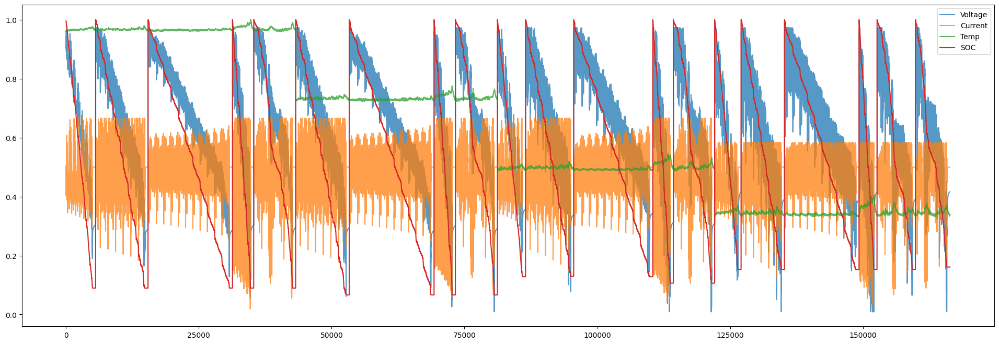

In [ ]:
####################################### Train cycle
V=train_x[:,0,0]
I=train_x[:,0,1]
T=train_x[:,0,2]
y=train_y[:,0,0]
fig = plt.figure(figsize=(24, 8))
plt.plot(V,label="Voltage",alpha=.75 )
plt.plot(I,label="Current",alpha=.75 )
plt.plot(T,label="Temp",alpha=.75 )
plt.plot(y, label="SOC", alpha=1)
plt.legend()
plt.show()

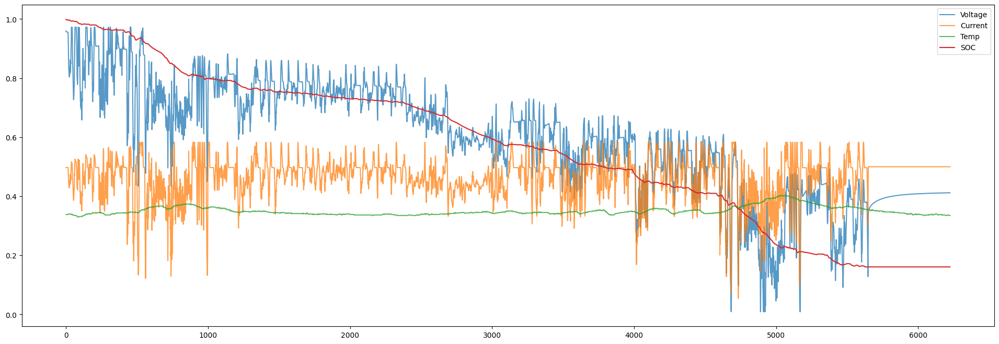

In [ ]:
####################################### 0 Degree Test cycle
V=test_0deg_x[:,0,0]
I=test_0deg_x[:,0,1]
T=test_0deg_x[:,0,2]
y=test_0deg_y[:,0,0]
fig = plt.figure(figsize=(24, 8))
plt.plot(V,label="Voltage",alpha=.75 )
plt.plot(I,label="Current",alpha=.75 )
plt.plot(T,label="Temp",alpha=.75 )
plt.plot(y, label="SOC", alpha=1)
plt.legend()
plt.show()

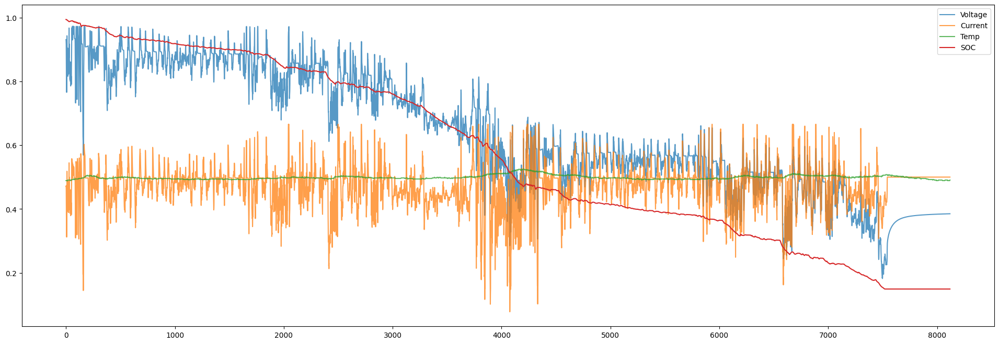

In [ ]:
####################################### 10 Degree Test cycle
V=test_10deg_x[:,0,0]
I=test_10deg_x[:,0,1]
T=test_10deg_x[:,0,2]
y=test_10deg_y[:,0,0]
fig = plt.figure(figsize=(24, 8))
plt.plot(V,label="Voltage",alpha=.75 )
plt.plot(I,label="Current",alpha=.75 )
plt.plot(T,label="Temp",alpha=.75 )
plt.plot(y, label="SOC", alpha=1)
plt.legend()
plt.show()

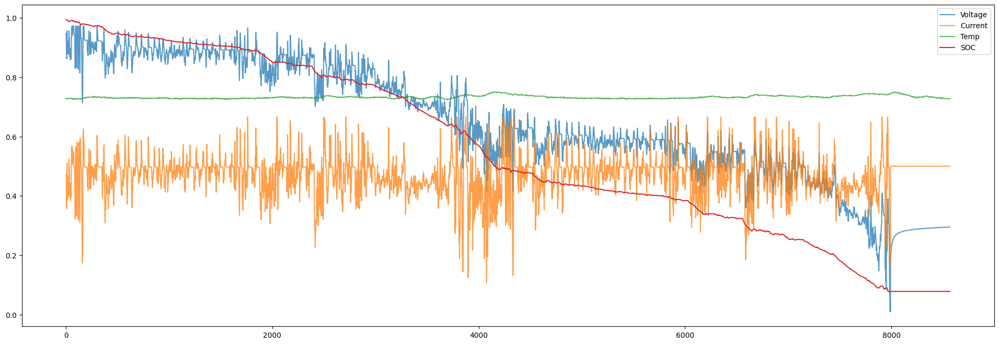

In [ ]:
####################################### 25 Degree Test cycle
V=test_25deg_x[:,0,0]
I=test_25deg_x[:,0,1]
T=test_25deg_x[:,0,2]
y=test_25deg_y[:,0,0]
fig = plt.figure(figsize=(24, 8))
plt.plot(V,label="Voltage",alpha=.75 )
plt.plot(I,label="Current",alpha=.75 )
plt.plot(T,label="Temp",alpha=.75 )
plt.plot(y, label="SOC", alpha=1)
plt.legend()
plt.show()

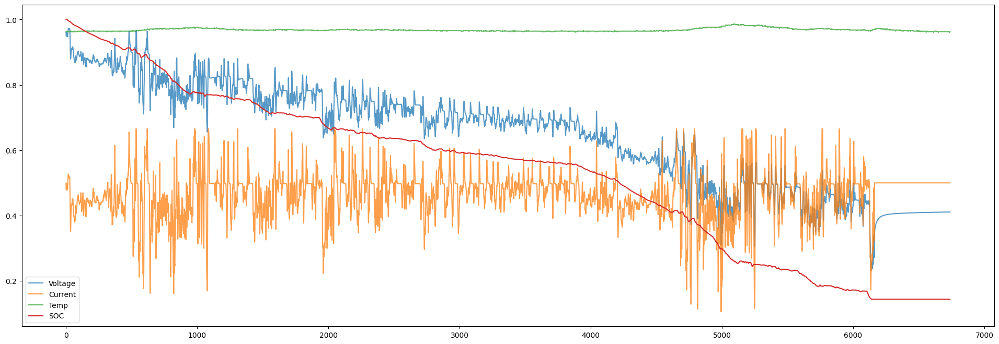

In [ ]:
####################################### 40 Degree Test cycle
V=test_40deg_x[:,0,0]
I=test_40deg_x[:,0,1]
T=test_40deg_x[:,0,2]
y=test_40deg_y[:,0,0]
fig = plt.figure(figsize=(24, 8))
plt.plot(V,label="Voltage",alpha=.75 )
plt.plot(I,label="Current",alpha=.75 )
plt.plot(T,label="Temp",alpha=.75 )
plt.plot(y, label="SOC", alpha=1)
plt.legend()
plt.show()

## 5.2 Model Training Error

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(y=model_hist.history['loss'],
                    mode='lines', name='train'))
fig.add_trace(go.Scatter(y=model_hist.history['val_loss'],
                    mode='lines', name='validation'))
fig.update_layout(title='Loss trend',
                  xaxis_title='epoch',
                  yaxis_title='loss',
                  width=1400,
                  height=600)
fig.show()

In [ ]:
print(model_hist.history.keys())

dict_keys(['loss', 'mae', 'rmse', 'val_loss', 'val_mae', 'val_rmse'])


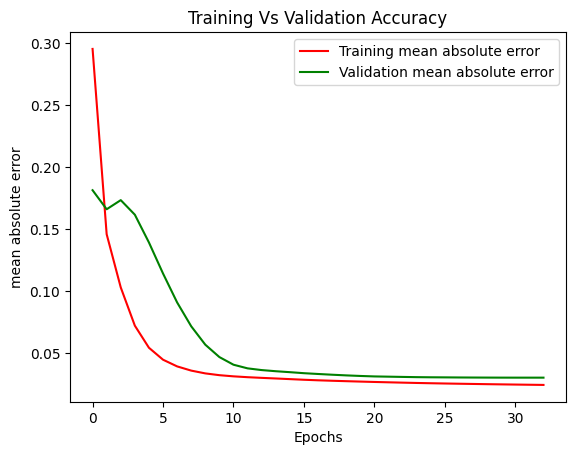

In [ ]:
plt.plot(model_hist.history['mae'], 'r', label='Training mean absolute error')
plt.plot(model_hist.history['val_mae'], 'g', label='Validation mean absolute error')
plt.title('Training Vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('mean absolute error')
plt.legend()
plt.show()


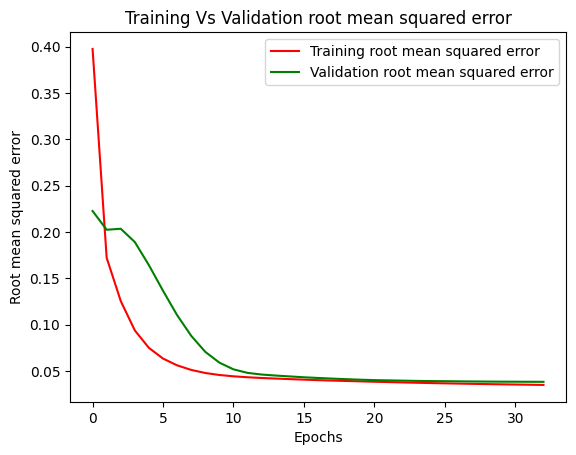

In [ ]:
plt.plot(model_hist.history['rmse'], 'r', label='Training root mean squared error')
plt.plot(model_hist.history['val_rmse'], 'g', label='Validation root mean squared error')
plt.title('Training Vs Validation root mean squared error')
plt.xlabel('Epochs')
plt.ylabel('Root mean squared error')
plt.legend()
plt.show()

##5.3 SOC Predictions using Training and Test sets

In [ ]:
 train_predictions = model.predict(train_x)

 cycle_num = 0
 steps_num = 180000
 step_index = np.arange(cycle_num*steps_num, (cycle_num+1)*steps_num)

 fig = go.Figure()
 fig.add_trace(go.Scatter(x=step_index, y=train_predictions.flatten()[cycle_num*steps_num:(cycle_num+1)*steps_num],
                     mode='lines', name='Predicted SoC '))
 fig.add_trace(go.Scatter(x=step_index, y=train_y.flatten()[cycle_num*steps_num:(cycle_num+1)*steps_num],
                     mode='lines', name='Calculated SoC '))
 fig.update_layout(title='Training set prediction',
                   xaxis_title='Step', yaxis_title='SoC percentage', width=1400, height=600)
 fig.show()

 480/5200 [=>............................] - ETA: 40s.:c: 55 :CPU%:  85.6
.:m: 55 :RAM(GB): 2.065731584
3862/5200 [=====================>........] - ETA: 11s.:c: 56 :CPU%:  90.3
.:m: 56 :RAM(GB): 2.066468864
5200/5200 [==============================] - 48s 9ms/step
.:c: 57 :CPU%:  12.5
.:m: 57 :RAM(GB): 2.11083264


In [ ]:
 test_predictions = model.predict(test_40deg_x)

 cycle_num = 0
 steps_num = 8000
 step_index = np.arange(cycle_num*steps_num, (cycle_num+1)*steps_num)

 fig = go.Figure()
 fig.add_trace(go.Scatter(x=step_index, y=test_predictions.flatten()[cycle_num*steps_num:(cycle_num+1)*steps_num],
                     mode='lines', name='SoC predicted'))
 fig.add_trace(go.Scatter(x=step_index, y=test_40deg_y.flatten()[cycle_num*steps_num:(cycle_num+1)*steps_num],
                     mode='lines', name='SoC actual'))
 fig.update_layout(title='Testing dataset GRU prediction - 40 degree C',
                   xaxis_title='Samples',
                   yaxis_title='SoC percentage',
                   width=1400,
                   height=600)
 fig.show()

211/211 [==============================] - 2s 12ms/step


In [ ]:
 test_predictions = model.predict(test_25deg_x)

 cycle_num = 0
 steps_num = 8000
 step_index = np.arange(cycle_num*steps_num, (cycle_num+1)*steps_num)

 fig = go.Figure()
 fig.add_trace(go.Scatter(x=step_index, y=test_predictions.flatten()[cycle_num*steps_num:(cycle_num+1)*steps_num],
                     mode='lines', name='SoC predicted'))
 fig.add_trace(go.Scatter(x=step_index, y=test_25deg_y.flatten()[cycle_num*steps_num:(cycle_num+1)*steps_num],
                     mode='lines', name='SoC actual'))
 fig.update_layout(title='Testing dataset GRU prediction - 25 deg',
                   xaxis_title='Samples',
                   yaxis_title='SoC percentage',
                   width=1400,
                   height=600)
 fig.show()

268/268 [==============================] - 4s 15ms/step


In [ ]:
type(test_predictions)

numpy.ndarray

In [ ]:
 test_predictions = model.predict(test_10deg_x)

 cycle_num = 0
 steps_num = 8000
 step_index = np.arange(cycle_num*steps_num, (cycle_num+1)*steps_num)

 fig = go.Figure()
 fig.add_trace(go.Scatter(x=step_index, y=test_predictions.flatten()[cycle_num*steps_num:(cycle_num+1)*steps_num],
                     mode='lines', name='SoC predicted'))
 fig.add_trace(go.Scatter(x=step_index, y=test_10deg_y.flatten()[cycle_num*steps_num:(cycle_num+1)*steps_num],
                     mode='lines', name='SoC actual'))
 fig.update_layout(title='Testing dataset GRU prediction - 10 degree C',
                   xaxis_title='Samples',
                   yaxis_title='SoC percentage',
                   width=1400,
                   height=600)
 fig.show()

209/254 [=======================>......] - ETA: 0s.:c: 75 :CPU%:  82.4
.:m: 75 :RAM(GB): 2.441588736
254/254 [==============================] - 4s 15ms/step


In [ ]:
 test_predictions = model.predict(test_0deg_x)

 cycle_num = 0
 steps_num = 8000
 step_index = np.arange(cycle_num*steps_num, (cycle_num+1)*steps_num)

 fig = go.Figure()
 fig.add_trace(go.Scatter(x=step_index, y=test_predictions.flatten()[cycle_num*steps_num:(cycle_num+1)*steps_num],
                     mode='lines', name='SoC predicted'))
 fig.add_trace(go.Scatter(x=step_index, y=test_0deg_y.flatten()[cycle_num*steps_num:(cycle_num+1)*steps_num],
                     mode='lines', name='SoC actual'))
 fig.update_layout(title='Testing dataset GRU prediction - 0 degree C',
                   xaxis_title='Samples',
                   yaxis_title='SoC percentage',
                   width=1400,
                   height=600)
 fig.show()

195/195 [==============================] - 3s 18ms/step
